anderm18 & shoupm

Necessary Imports to Run Project; updates version of Gym for access to FrozenLake-v1 (which works with display driver)

In [ ]:
!apt update && apt install xvfb
!pip install gym-notebook-wrapper
!pip install gym==0.24
!pip install gym[toy_text]

In [ ]:
#https://youtu.be/HGeI30uATws

Set up the FrozenLake-v1 environment with the environment wrapper. The FrozenLake-v1 environment has a set number of states, so we won't be able to do state variation here. However, we can play around with our alpha, gamma, and epsilon values! 

We also want to initialize our QTable here. If we look, we can see that the number of rows is 16, as this is a 4x4 observation space, and the columns are 4, since there are 4 actions we can take

In [91]:
import gym
import matplotlib.pyplot as plt
import gnwrapper
import random as rand
import numpy as np
env = gnwrapper.Monitor(gym.make("FrozenLake-v1", is_slippery=False, map_name="4x4"))
actionspace = env.action_space.n
obspace = env.observation_space.n

temp = (int(obspace), int(actionspace))
QTable = np.zeros(temp)
#print(QTable)

Now, we need to initialize some variables that our Algorithm will use. TOTAL_EPISODES corresponds to how many iterations we want to Train for, and FRAMES are how many frames each episode is allowed. Then, we have our Epsilon, Gamma and Alpha values, and our decay constant.

In [92]:
TOTAL_EPISODES = 10000
FRAMES = 200
epsilon = .9
gamma = .9
alpha = .5
decay = .001

This is just a helper function to decide which action to choose next based off the current obsevration state. It just produces a random number and compares it to epsilon.

In [93]:
def next_action(observation):
    action=0
    if rand.random() > epsilon:
        action = np.argmax(QTable[observation, :])
    else:
        action = env.action_space.sample()
    return action

This is our SARSA algorithm. It works by using the following formula (from lecture):

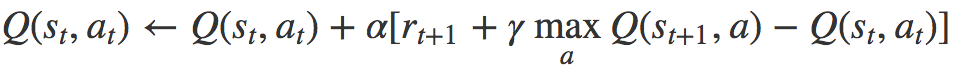

SARSA is ON POLICY, meaning it uses the action in the current policy to learn the Q-Value. So, our algorithm grabs the current observation and reward, and from that computes the Q-Value with the last observation and reward. Then, we have a decay function for our Epsilon after every Episode (epoch) that computes a new epsilon based on our decay constant above. This algorithm is blazing fast, and takes only a few seconds to complete

In [94]:
rewards = []
avgs = []

for epoch in range(TOTAL_EPISODES):
  observation = env.reset()
  action = next_action(observation)
  rewardTotal = 0
  for act in range(FRAMES):

    
    obstemp, reward, done, info = env.step(action)

    nextact = next_action(obstemp)
    
    QTable[observation, action] = QTable[observation, action] + alpha * \
      ((reward + gamma*QTable[obstemp,nextact]) - QTable[observation, action])
    action = nextact
    observation = obstemp
    rewardTotal += reward

    if done:
      
      break

  avgs.append(rewardTotal)
  epsilon = .01 + (.99)*np.exp(-decay*epoch)
  rewards.append(sum(avgs)/len(avgs))

rewards1 = rewards

NOTE: The display wrapper we were able to get working to display this video displays every video that it was able to record, but for some reason always breaks the last one. To see our best perfomer, run the following and play the SECOND TO LAST video. Sorry for the inconvience!

In [95]:
env.display()

'rl-video-episode-0.mp4'

'rl-video-episode-1.mp4'

'rl-video-episode-8.mp4'

'rl-video-episode-8.mp4'

'rl-video-episode-27.mp4'

'rl-video-episode-27.mp4'

'rl-video-episode-64.mp4'

'rl-video-episode-64.mp4'

'rl-video-episode-125.mp4'

'rl-video-episode-125.mp4'

'rl-video-episode-216.mp4'

'rl-video-episode-216.mp4'

'rl-video-episode-343.mp4'

'rl-video-episode-343.mp4'

'rl-video-episode-512.mp4'

'rl-video-episode-512.mp4'

'rl-video-episode-729.mp4'

'rl-video-episode-729.mp4'

'rl-video-episode-1000.mp4'

'rl-video-episode-1000.mp4'

'rl-video-episode-2000.mp4'

'rl-video-episode-2000.mp4'

'rl-video-episode-3000.mp4'

'rl-video-episode-3000.mp4'

'rl-video-episode-4000.mp4'

'rl-video-episode-4000.mp4'

'rl-video-episode-5000.mp4'

'rl-video-episode-5000.mp4'

'rl-video-episode-6000.mp4'

'rl-video-episode-6000.mp4'

'rl-video-episode-7000.mp4'

'rl-video-episode-7000.mp4'

'rl-video-episode-8000.mp4'

'rl-video-episode-8000.mp4'

'rl-video-episode-9000.mp4'

'rl-video-episode-9000.mp4'

'rl-video-episode-10000.mp4'

Ok, SARSA handled. Now, let's reset our enviroment's variables to get started on Q Learning. All this is doing is resetting the alpha, gamma, epsilon, and decay, and resetting the QTable to 0's

In [96]:
TOTAL_EPISODES = 10000
FRAMES = 200
epsilon = .9
gamma = .9
alpha = .5
decay = .001

actionspace = env.action_space.n
obspace = env.observation_space.n

temp = (int(obspace), int(actionspace))
QTable = np.zeros(temp)

env.reset()

0

Now, here is our Q-Learning algorithm based on the following formula:

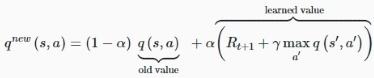

The difference here is that Q Learning is OFF POLICY, meaning it uses a more greedy approach to get the Q-Value by another policy's action. Notice that we using a learned policy for this Qlearning iteration. This is to test the difference in not only SARSA v QLearning, but using a different policy (as per the assignment)

In [97]:
rewards = []
avgs = []

for frame in range(TOTAL_EPISODES):
  observation = env.reset()
  action = next_action(observation)
  rewardTotal = 0
  for act in range(FRAMES):
    
    obstemp, reward, done, info = env.step(action)

    nextact = next_action(obstemp)
    
    QTable[observation, action] = QTable[observation, action]*(1-alpha) + alpha * \
      (reward + gamma*np.amax(QTable[obstemp, :]))
    action = nextact
    observation = obstemp
    rewardTotal += reward

    if done:
      
      break

  avgs.append(rewardTotal)
  epsilon = .01 + (.99)*np.exp(-decay*frame)
  rewards.append(sum(avgs)/len(avgs))



So, we can now form a graph using plt!

Something to view here is that SARSA seems to be slightly faster at finding the Goal than QLearning. This is most likely due to the greedy approach of QLearning's Off Policy method. However, we can see this difference to be minimal here; the environment is little and doesn't require much long term computation to get the goal.


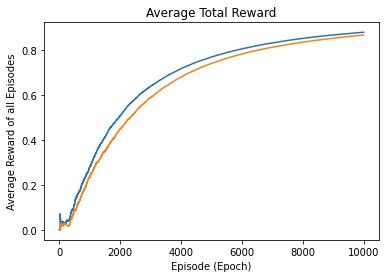

In [98]:
#plt.plot([i for i in range(TOTAL_EPISODES)], rewards, label="4x4")
plt.plot([i for i in range(TOTAL_EPISODES)], rewards, label="SARSA")
plt.plot([i for i in range(TOTAL_EPISODES)], rewards1, label="Q-Learning")
plt.plot()
plt.title("Average Total Reward")
plt.xlabel("Episode (Epoch)")
plt.ylabel("Average Reward of all Episodes")
plt.show()

Same exact situation as before : )

In [99]:
env.display()

'rl-video-episode-0.mp4'

'rl-video-episode-1.mp4'

'rl-video-episode-8.mp4'

'rl-video-episode-8.mp4'

'rl-video-episode-27.mp4'

'rl-video-episode-27.mp4'

'rl-video-episode-64.mp4'

'rl-video-episode-64.mp4'

'rl-video-episode-125.mp4'

'rl-video-episode-125.mp4'

'rl-video-episode-216.mp4'

'rl-video-episode-216.mp4'

'rl-video-episode-343.mp4'

'rl-video-episode-343.mp4'

'rl-video-episode-512.mp4'

'rl-video-episode-512.mp4'

'rl-video-episode-729.mp4'

'rl-video-episode-729.mp4'

'rl-video-episode-1000.mp4'

'rl-video-episode-1000.mp4'

'rl-video-episode-2000.mp4'

'rl-video-episode-2000.mp4'

'rl-video-episode-3000.mp4'

'rl-video-episode-3000.mp4'

'rl-video-episode-4000.mp4'

'rl-video-episode-4000.mp4'

'rl-video-episode-5000.mp4'

'rl-video-episode-5000.mp4'

'rl-video-episode-6000.mp4'

'rl-video-episode-6000.mp4'

'rl-video-episode-7000.mp4'

'rl-video-episode-7000.mp4'

'rl-video-episode-8000.mp4'

'rl-video-episode-8000.mp4'

'rl-video-episode-9000.mp4'

'rl-video-episode-9000.mp4'

'rl-video-episode-10000.mp4'

'rl-video-episode-10000.mp4'

'rl-video-episode-10000.mp4'

'rl-video-episode-11000.mp4'

'rl-video-episode-11000.mp4'

'rl-video-episode-12000.mp4'

'rl-video-episode-12000.mp4'

'rl-video-episode-13000.mp4'

'rl-video-episode-13000.mp4'

'rl-video-episode-14000.mp4'

'rl-video-episode-14000.mp4'

'rl-video-episode-15000.mp4'

'rl-video-episode-15000.mp4'

'rl-video-episode-16000.mp4'

'rl-video-episode-16000.mp4'

'rl-video-episode-17000.mp4'

'rl-video-episode-17000.mp4'

'rl-video-episode-18000.mp4'

'rl-video-episode-18000.mp4'

'rl-video-episode-19000.mp4'

'rl-video-episode-19000.mp4'

'rl-video-episode-20000.mp4'

Now that we have a reliable QLearning and SARSA algorithm for each, let's try to vary our alpha and gamma values and see what happens:

In [ ]:
TOTAL_EPISODES = 10000
FRAMES = 200
epsilon = .9
gamma = .1
alpha = .9
decay = .001

actionspace = env.action_space.n
obspace = env.observation_space.n

temp = (int(obspace), int(actionspace))
QTable = np.zeros(temp)

env.reset()

rewards = []
avgs = []

for epoch in range(TOTAL_EPISODES):
  observation = env.reset()
  action = next_action(observation)
  rewardTotal = 0
  for act in range(FRAMES):

    
    obstemp, reward, done, info = env.step(action)

    nextact = next_action(obstemp)
    
    QTable[observation, action] = QTable[observation, action] + alpha * \
      ((reward + gamma*QTable[obstemp,nextact]) - QTable[observation, action])
    action = nextact
    observation = obstemp
    rewardTotal += reward

    if done:
      
      break

  avgs.append(rewardTotal)
  epsilon = .01 + (.99)*np.exp(-decay*epoch)
  rewards.append(sum(avgs)/len(avgs))

rewards1 = rewards

In [ ]:
env.display()

'rl-video-episode-0.mp4'

'rl-video-episode-1.mp4'

'rl-video-episode-8.mp4'

'rl-video-episode-8.mp4'

'rl-video-episode-27.mp4'

'rl-video-episode-27.mp4'

'rl-video-episode-64.mp4'

'rl-video-episode-64.mp4'

'rl-video-episode-125.mp4'

'rl-video-episode-125.mp4'

'rl-video-episode-216.mp4'

'rl-video-episode-216.mp4'

'rl-video-episode-343.mp4'

'rl-video-episode-343.mp4'

'rl-video-episode-512.mp4'

'rl-video-episode-512.mp4'

'rl-video-episode-729.mp4'

'rl-video-episode-729.mp4'

'rl-video-episode-1000.mp4'

'rl-video-episode-1000.mp4'

'rl-video-episode-2000.mp4'

'rl-video-episode-2000.mp4'

'rl-video-episode-3000.mp4'

'rl-video-episode-3000.mp4'

'rl-video-episode-4000.mp4'

'rl-video-episode-4000.mp4'

'rl-video-episode-5000.mp4'

'rl-video-episode-5000.mp4'

'rl-video-episode-6000.mp4'

'rl-video-episode-6000.mp4'

'rl-video-episode-7000.mp4'

'rl-video-episode-7000.mp4'

'rl-video-episode-8000.mp4'

'rl-video-episode-8000.mp4'

'rl-video-episode-9000.mp4'

'rl-video-episode-9000.mp4'

'rl-video-episode-10000.mp4'

'rl-video-episode-10000.mp4'

'rl-video-episode-10000.mp4'

'rl-video-episode-11000.mp4'

'rl-video-episode-11000.mp4'

'rl-video-episode-12000.mp4'

'rl-video-episode-12000.mp4'

'rl-video-episode-13000.mp4'

'rl-video-episode-13000.mp4'

'rl-video-episode-14000.mp4'

'rl-video-episode-14000.mp4'

'rl-video-episode-15000.mp4'

'rl-video-episode-15000.mp4'

'rl-video-episode-16000.mp4'

'rl-video-episode-16000.mp4'

'rl-video-episode-17000.mp4'

'rl-video-episode-17000.mp4'

'rl-video-episode-18000.mp4'

'rl-video-episode-18000.mp4'

'rl-video-episode-19000.mp4'

'rl-video-episode-19000.mp4'

'rl-video-episode-20000.mp4'

'rl-video-episode-20000.mp4'

'rl-video-episode-20000.mp4'

'rl-video-episode-21000.mp4'

'rl-video-episode-21000.mp4'

'rl-video-episode-22000.mp4'

'rl-video-episode-22000.mp4'

'rl-video-episode-23000.mp4'

'rl-video-episode-23000.mp4'

'rl-video-episode-24000.mp4'

'rl-video-episode-24000.mp4'

'rl-video-episode-25000.mp4'

'rl-video-episode-25000.mp4'

'rl-video-episode-26000.mp4'

'rl-video-episode-26000.mp4'

'rl-video-episode-27000.mp4'

'rl-video-episode-27000.mp4'

'rl-video-episode-28000.mp4'

'rl-video-episode-28000.mp4'

'rl-video-episode-29000.mp4'

'rl-video-episode-29000.mp4'

'rl-video-episode-30000.mp4'

'rl-video-episode-30000.mp4'

'rl-video-episode-30000.mp4'

'rl-video-episode-31000.mp4'

'rl-video-episode-31000.mp4'

'rl-video-episode-32000.mp4'

'rl-video-episode-32000.mp4'

'rl-video-episode-33000.mp4'

'rl-video-episode-33000.mp4'

'rl-video-episode-34000.mp4'

'rl-video-episode-34000.mp4'

'rl-video-episode-35000.mp4'

'rl-video-episode-35000.mp4'

'rl-video-episode-36000.mp4'

'rl-video-episode-36000.mp4'

'rl-video-episode-37000.mp4'

'rl-video-episode-37000.mp4'

'rl-video-episode-38000.mp4'

'rl-video-episode-38000.mp4'

'rl-video-episode-39000.mp4'

'rl-video-episode-39000.mp4'

'rl-video-episode-40000.mp4'

'rl-video-episode-40000.mp4'

'rl-video-episode-41000.mp4'

'rl-video-episode-41000.mp4'

'rl-video-episode-42000.mp4'

'rl-video-episode-42000.mp4'

'rl-video-episode-43000.mp4'

'rl-video-episode-43000.mp4'

'rl-video-episode-44000.mp4'

'rl-video-episode-44000.mp4'

'rl-video-episode-45000.mp4'

'rl-video-episode-45000.mp4'

'rl-video-episode-46000.mp4'

'rl-video-episode-46000.mp4'

'rl-video-episode-47000.mp4'

'rl-video-episode-47000.mp4'

'rl-video-episode-48000.mp4'

'rl-video-episode-48000.mp4'

'rl-video-episode-49000.mp4'

'rl-video-episode-49000.mp4'

'rl-video-episode-50000.mp4'

'rl-video-episode-50000.mp4'

'rl-video-episode-51000.mp4'

'rl-video-episode-51000.mp4'

'rl-video-episode-52000.mp4'

'rl-video-episode-52000.mp4'

'rl-video-episode-53000.mp4'

'rl-video-episode-53000.mp4'

'rl-video-episode-54000.mp4'

'rl-video-episode-54000.mp4'

'rl-video-episode-55000.mp4'

'rl-video-episode-55000.mp4'

'rl-video-episode-56000.mp4'

'rl-video-episode-56000.mp4'

'rl-video-episode-57000.mp4'

'rl-video-episode-57000.mp4'

'rl-video-episode-58000.mp4'

'rl-video-episode-58000.mp4'

'rl-video-episode-59000.mp4'

'rl-video-episode-59000.mp4'

'rl-video-episode-60000.mp4'

'rl-video-episode-60000.mp4'

'rl-video-episode-61000.mp4'

'rl-video-episode-61000.mp4'

'rl-video-episode-62000.mp4'

'rl-video-episode-62000.mp4'

'rl-video-episode-63000.mp4'

'rl-video-episode-63000.mp4'

'rl-video-episode-64000.mp4'

'rl-video-episode-64000.mp4'

'rl-video-episode-65000.mp4'

'rl-video-episode-65000.mp4'

'rl-video-episode-66000.mp4'

'rl-video-episode-66000.mp4'

'rl-video-episode-67000.mp4'

'rl-video-episode-67000.mp4'

'rl-video-episode-68000.mp4'

'rl-video-episode-68000.mp4'

'rl-video-episode-69000.mp4'

'rl-video-episode-69000.mp4'

'rl-video-episode-70000.mp4'

'rl-video-episode-70000.mp4'

'rl-video-episode-71000.mp4'

'rl-video-episode-71000.mp4'

'rl-video-episode-72000.mp4'

'rl-video-episode-72000.mp4'

'rl-video-episode-73000.mp4'

'rl-video-episode-73000.mp4'

'rl-video-episode-74000.mp4'

'rl-video-episode-74000.mp4'

'rl-video-episode-75000.mp4'

'rl-video-episode-75000.mp4'

'rl-video-episode-76000.mp4'

'rl-video-episode-76000.mp4'

'rl-video-episode-77000.mp4'

'rl-video-episode-77000.mp4'

'rl-video-episode-78000.mp4'

'rl-video-episode-78000.mp4'

'rl-video-episode-79000.mp4'

'rl-video-episode-79000.mp4'

In [ ]:
TOTAL_EPISODES = 10000
FRAMES = 200
epsilon = .9
gamma = .1
alpha = .9
decay = .001
actionspace = env.action_space.n
obspace = env.observation_space.n

temp = (int(obspace), int(actionspace))
QTable = np.zeros(temp)

env.reset()

rewards = []
avgs = []

for frame in range(TOTAL_EPISODES):
  observation = env.reset()
  action = next_action(observation)
  rewardTotal = 0
  for act in range(FRAMES):
    
    obstemp, reward, done, info = env.step(action)

    nextact = next_action(obstemp)
    
    QTable[observation, action] = QTable[observation, action]*(1-alpha) + alpha * \
      (reward + gamma*np.amax(QTable[obstemp, :]))
    action = nextact
    observation = obstemp
    rewardTotal += reward

    if done:
      
      break

  avgs.append(rewardTotal)
  epsilon = .01 + (.99)*np.exp(-decay*frame)
  rewards.append(sum(avgs)/len(avgs))

In [ ]:
env.display()

'rl-video-episode-0.mp4'

'rl-video-episode-1.mp4'

'rl-video-episode-8.mp4'

'rl-video-episode-8.mp4'

'rl-video-episode-27.mp4'

'rl-video-episode-27.mp4'

'rl-video-episode-64.mp4'

'rl-video-episode-64.mp4'

'rl-video-episode-125.mp4'

'rl-video-episode-125.mp4'

'rl-video-episode-216.mp4'

'rl-video-episode-216.mp4'

'rl-video-episode-343.mp4'

'rl-video-episode-343.mp4'

'rl-video-episode-512.mp4'

'rl-video-episode-512.mp4'

'rl-video-episode-729.mp4'

'rl-video-episode-729.mp4'

'rl-video-episode-1000.mp4'

'rl-video-episode-1000.mp4'

'rl-video-episode-2000.mp4'

'rl-video-episode-2000.mp4'

'rl-video-episode-3000.mp4'

'rl-video-episode-3000.mp4'

'rl-video-episode-4000.mp4'

'rl-video-episode-4000.mp4'

'rl-video-episode-5000.mp4'

'rl-video-episode-5000.mp4'

'rl-video-episode-6000.mp4'

'rl-video-episode-6000.mp4'

'rl-video-episode-7000.mp4'

'rl-video-episode-7000.mp4'

'rl-video-episode-8000.mp4'

'rl-video-episode-8000.mp4'

'rl-video-episode-9000.mp4'

'rl-video-episode-9000.mp4'

'rl-video-episode-10000.mp4'

'rl-video-episode-10000.mp4'

'rl-video-episode-10000.mp4'

'rl-video-episode-11000.mp4'

'rl-video-episode-11000.mp4'

'rl-video-episode-12000.mp4'

'rl-video-episode-12000.mp4'

'rl-video-episode-13000.mp4'

'rl-video-episode-13000.mp4'

'rl-video-episode-14000.mp4'

'rl-video-episode-14000.mp4'

'rl-video-episode-15000.mp4'

'rl-video-episode-15000.mp4'

'rl-video-episode-16000.mp4'

'rl-video-episode-16000.mp4'

'rl-video-episode-17000.mp4'

'rl-video-episode-17000.mp4'

'rl-video-episode-18000.mp4'

'rl-video-episode-18000.mp4'

'rl-video-episode-19000.mp4'

'rl-video-episode-19000.mp4'

'rl-video-episode-20000.mp4'

'rl-video-episode-20000.mp4'

'rl-video-episode-20000.mp4'

'rl-video-episode-21000.mp4'

'rl-video-episode-21000.mp4'

'rl-video-episode-22000.mp4'

'rl-video-episode-22000.mp4'

'rl-video-episode-23000.mp4'

'rl-video-episode-23000.mp4'

'rl-video-episode-24000.mp4'

'rl-video-episode-24000.mp4'

'rl-video-episode-25000.mp4'

'rl-video-episode-25000.mp4'

'rl-video-episode-26000.mp4'

'rl-video-episode-26000.mp4'

'rl-video-episode-27000.mp4'

'rl-video-episode-27000.mp4'

'rl-video-episode-28000.mp4'

'rl-video-episode-28000.mp4'

'rl-video-episode-29000.mp4'

'rl-video-episode-29000.mp4'

'rl-video-episode-30000.mp4'

'rl-video-episode-30000.mp4'

'rl-video-episode-30000.mp4'

'rl-video-episode-31000.mp4'

'rl-video-episode-31000.mp4'

'rl-video-episode-32000.mp4'

'rl-video-episode-32000.mp4'

'rl-video-episode-33000.mp4'

'rl-video-episode-33000.mp4'

'rl-video-episode-34000.mp4'

'rl-video-episode-34000.mp4'

'rl-video-episode-35000.mp4'

'rl-video-episode-35000.mp4'

'rl-video-episode-36000.mp4'

'rl-video-episode-36000.mp4'

'rl-video-episode-37000.mp4'

'rl-video-episode-37000.mp4'

'rl-video-episode-38000.mp4'

'rl-video-episode-38000.mp4'

'rl-video-episode-39000.mp4'

'rl-video-episode-39000.mp4'

'rl-video-episode-40000.mp4'

'rl-video-episode-40000.mp4'

'rl-video-episode-41000.mp4'

'rl-video-episode-41000.mp4'

'rl-video-episode-42000.mp4'

'rl-video-episode-42000.mp4'

'rl-video-episode-43000.mp4'

'rl-video-episode-43000.mp4'

'rl-video-episode-44000.mp4'

'rl-video-episode-44000.mp4'

'rl-video-episode-45000.mp4'

'rl-video-episode-45000.mp4'

'rl-video-episode-46000.mp4'

'rl-video-episode-46000.mp4'

'rl-video-episode-47000.mp4'

'rl-video-episode-47000.mp4'

'rl-video-episode-48000.mp4'

'rl-video-episode-48000.mp4'

'rl-video-episode-49000.mp4'

'rl-video-episode-49000.mp4'

'rl-video-episode-50000.mp4'

'rl-video-episode-50000.mp4'

'rl-video-episode-51000.mp4'

'rl-video-episode-51000.mp4'

'rl-video-episode-52000.mp4'

'rl-video-episode-52000.mp4'

'rl-video-episode-53000.mp4'

'rl-video-episode-53000.mp4'

'rl-video-episode-54000.mp4'

'rl-video-episode-54000.mp4'

'rl-video-episode-55000.mp4'

'rl-video-episode-55000.mp4'

'rl-video-episode-56000.mp4'

'rl-video-episode-56000.mp4'

'rl-video-episode-57000.mp4'

'rl-video-episode-57000.mp4'

'rl-video-episode-58000.mp4'

'rl-video-episode-58000.mp4'

'rl-video-episode-59000.mp4'

'rl-video-episode-59000.mp4'

'rl-video-episode-60000.mp4'

'rl-video-episode-60000.mp4'

'rl-video-episode-61000.mp4'

'rl-video-episode-61000.mp4'

'rl-video-episode-62000.mp4'

'rl-video-episode-62000.mp4'

'rl-video-episode-63000.mp4'

'rl-video-episode-63000.mp4'

'rl-video-episode-64000.mp4'

'rl-video-episode-64000.mp4'

'rl-video-episode-65000.mp4'

'rl-video-episode-65000.mp4'

'rl-video-episode-66000.mp4'

'rl-video-episode-66000.mp4'

'rl-video-episode-67000.mp4'

'rl-video-episode-67000.mp4'

'rl-video-episode-68000.mp4'

'rl-video-episode-68000.mp4'

'rl-video-episode-69000.mp4'

'rl-video-episode-69000.mp4'

'rl-video-episode-70000.mp4'

'rl-video-episode-70000.mp4'

'rl-video-episode-71000.mp4'

'rl-video-episode-71000.mp4'

'rl-video-episode-72000.mp4'

'rl-video-episode-72000.mp4'

'rl-video-episode-73000.mp4'

'rl-video-episode-73000.mp4'

'rl-video-episode-74000.mp4'

'rl-video-episode-74000.mp4'

'rl-video-episode-75000.mp4'

'rl-video-episode-75000.mp4'

'rl-video-episode-76000.mp4'

'rl-video-episode-76000.mp4'

'rl-video-episode-77000.mp4'

'rl-video-episode-77000.mp4'

'rl-video-episode-78000.mp4'

'rl-video-episode-78000.mp4'

'rl-video-episode-79000.mp4'

'rl-video-episode-79000.mp4'

'rl-video-episode-80000.mp4'

'rl-video-episode-80000.mp4'

'rl-video-episode-81000.mp4'

'rl-video-episode-81000.mp4'

'rl-video-episode-82000.mp4'

'rl-video-episode-82000.mp4'

'rl-video-episode-83000.mp4'

'rl-video-episode-83000.mp4'

'rl-video-episode-84000.mp4'

'rl-video-episode-84000.mp4'

'rl-video-episode-85000.mp4'

'rl-video-episode-85000.mp4'

'rl-video-episode-86000.mp4'

'rl-video-episode-86000.mp4'

'rl-video-episode-87000.mp4'

'rl-video-episode-87000.mp4'

'rl-video-episode-88000.mp4'

'rl-video-episode-88000.mp4'

'rl-video-episode-89000.mp4'

'rl-video-episode-89000.mp4'

This doesn't look that bad!

We greatly increased our alpha, and greatly decreased our gamma. Why does the graph look the same? Well, take a look at the videos. The very last few videos of both our SARSA test and QLearning Test. We can calearly see that the character still sometimes fail. This of course is due to our changes, as the algorithms are finding the end, but instead of pushing to reach their goal, their high learning rate and low alpha is encoragin signifcant exploration. We can also see the curve takes a little longer to reach the higher averages, this is because it takes longer for the algorithm to adopt to the newly found paths since it is trying so many random ones.


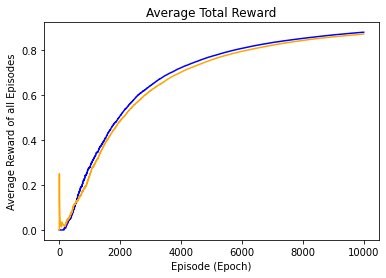

In [ ]:
#plt.plot([i for i in range(TOTAL_EPISODES)], rewards, label="4x4")
plt.plot([i for i in range(TOTAL_EPISODES)], rewards, color='blue')
plt.plot([i for i in range(TOTAL_EPISODES)], rewards1, color='orange')
plt.plot()
plt.title("Average Total Reward")
plt.xlabel("Episode (Epoch)")
plt.ylabel("Average Reward of all Episodes")
plt.show()

=================================================================================================================

FROM HERE DOWN IS CARTPOLE


Okay, so, we saw how QLearning and SARSA are useful in an environment with set observation, but what about an enviornment without like CartPole? CartPole's observations are not discrete, meaning we have to handle them. Let's first take care of the rest of the setup:

First, we're going to have to deal with radians, so import math


In [58]:
import math

Now, we need to crate an environment. The method to create a QTable we are using here uses 'buckets' to hold groups of discretized observations. We found online that it is more efficient to use random numbers between 0 and 1 to setup the QTable, so we gave that a try as well:

NOTE: This is our 'RESET FUNCTION'

In [ ]:
env = gnwrapper.Monitor(gym.make("CartPole-v1"))
buckets = (30,30,50,50)
actionspace = env.action_space.n

TOTAL_EPISODES = 20000
FRAMES = 200
epsilon = .9
gamma = .9
alpha = .5
decay = .001

QTable = np.random.randn(50,50,actionspace)
print(QTable)

Now, here's where things get interesting. We need a way to discretize states. After a LOT of research, we were able to find a way that shifts the observation space to fit between each of the action spaces that correspond to every observation index.

In [69]:
def make_discrete(observation):
  disc=np.array([0,0])
  temp = (observation[2] - (-env.observation_space.high[2])) // \
          ((env.observation_space.high[2] - (-env.observation_space.high[2]))/50)
  disc[0] = min(49, max(temp, 0))
  temp = (observation[3] - (-math.radians(50)))// \
          ((math.radians(50) - (-math.radians(50)))/50)
  disc[1] = min(49, max(temp, 0))
  return tuple(disc.astype(int))

Bringing down next action, only difference here is due to shape, we don't need the colon

In [70]:
def next_action(observation):
    action=0
    if rand.random() > epsilon:
        action = np.argmax(QTable[observation])
    else:
        action = np.random.randint(0, env.action_space.n)
    return action

Okay, so here is our SARSA implementation. Here, we're using Temporal Difference, to test out another policy method. Here, we can see there's not too much of a difference from our methods above, with slight modifications to make our SARSA implementation work with CartPole-v1

In [55]:
rewards = []
avgs = []

for epoch in range(TOTAL_EPISODES):
  observation = make_discrete(env.reset())
  action = next_action(observation)
  rewardTotal = 0
  for act in range(FRAMES):

    
    obstemp, reward, done, info = env.step(action)

    obstempdisc = make_discrete(obstemp)
    nextact = next_action(obstempdisc)

    
    QTable[observation + (action,)] = QTable[observation + (action,)] + \
              alpha*(reward + gamma*QTable[obstempdisc + (nextact,)]-QTable[observation + (action,)])
    action = nextact
    observation = obstempdisc
    rewardTotal += reward

    if done:
      
      break

  avgs.append(rewardTotal)
  epsilon = .01 + (.99)*np.exp(-decay*epoch)
  rewards.append(sum(avgs)/len(avgs))

rewards1 = rewards

Here, we have our Q-Learning implementation. We're using the Temporal Difference method, unlike in FrozenLake. We are doing this to see the difference between the two policies (as per the assigmment). As you can again see, there's really not much difference except for our new policy and minor tweaks (similar to our above SARSA implementation) to make it work with CartPole-v1

In [62]:
rewards = []
avgs = []

for epoch in range(TOTAL_EPISODES):
  observation = make_discrete(env.reset())
  action = next_action(observation)
  rewardTotal = 0
  for act in range(FRAMES):

    
    obstemp, reward, done, info = env.step(action)

    obstempdisc = make_discrete(obstemp)
    nextact = next_action(obstempdisc)

    
    QTable[observation + (action,)] = QTable[observation[0], observation[1], action] +alpha * \
                  (reward+gamma*np.max(QTable[obstempdisc[0],obstempdisc[1]]) - QTable[observation[0], observation[1], action])
    action = nextact
    observation = obstempdisc
    rewardTotal += reward

    if done:
      
      break

  avgs.append(rewardTotal)
  epsilon = .01 + (.99)*np.exp(-decay*epoch)
  rewards.append(sum(avgs)/len(avgs))
  

Let's review this data. Clearly, QLearning was better at this task than SARSA. Why? Well, we seem to think this is because SARSA equation depends on the next state and action, when in CartPole, this doesn't really mean much. If we look ahead to the next step and see that the pole is slightly more to the left, and it recieved one more reward (as CartPole rewards +1 per step), then this means the SARSA algorithm only actually 'learns' when the Agent loses. This takes away from the point of SARSA, and we can conclude that while SARSA does work in this case, it may not be the best option (compared to normal QLearning, at least).

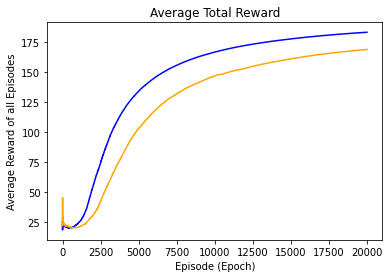

In [63]:
plt.plot([i for i in range(TOTAL_EPISODES)], rewards, color='blue')
plt.plot([i for i in range(TOTAL_EPISODES)], rewards1, color='orange')

plt.plot()
plt.title("Average Total Reward")
plt.xlabel("Episode (Epoch)")
plt.ylabel("Average Reward of all Episodes")
plt.show()

Now, let's test with some different gamma and alpha values. This time, we want to try it with low alpha AND low gamma. Let's see what happens:

(New Reset Function)

In [ ]:
env = gnwrapper.Monitor(gym.make("CartPole-v1"))
buckets = (30,30,50,50)
actionspace = env.action_space.n

TOTAL_EPISODES = 20000
FRAMES = 200
epsilon = .9
gamma = .1
alpha = .1
decay = .001

QTable = np.random.randn(50,50,actionspace)
print(QTable)

SARSA 

In [72]:
rewards = []
avgs = []

for epoch in range(TOTAL_EPISODES):
  observation = make_discrete(env.reset())
  action = next_action(observation)
  rewardTotal = 0
  for act in range(FRAMES):

    
    obstemp, reward, done, info = env.step(action)

    obstempdisc = make_discrete(obstemp)
    nextact = next_action(obstempdisc)

    
    QTable[observation + (action,)] = QTable[observation + (action,)] + \
              alpha*(reward + gamma*QTable[obstempdisc + (nextact,)]-QTable[observation + (action,)])
    action = nextact
    observation = obstempdisc
    rewardTotal += reward

    if done:
      
      break

  avgs.append(rewardTotal)
  epsilon = .01 + (.99)*np.exp(-decay*epoch)
  rewards.append(sum(avgs)/len(avgs))

rewards1 = rewards

Q Learning (Run Reset)

In [75]:
rewards = []
avgs = []

for epoch in range(TOTAL_EPISODES):
  observation = make_discrete(env.reset())
  action = next_action(observation)
  rewardTotal = 0
  for act in range(FRAMES):

    
    obstemp, reward, done, info = env.step(action)

    obstempdisc = make_discrete(obstemp)
    nextact = next_action(obstempdisc)

    
    QTable[observation + (action,)] = QTable[observation[0], observation[1], action] +alpha * \
                  (reward+gamma*np.max(QTable[obstempdisc[0],obstempdisc[1]]) - QTable[observation[0], observation[1], action])
    action = nextact
    observation = obstempdisc
    rewardTotal += reward

    if done:
      
      break

  avgs.append(rewardTotal)
  epsilon = .01 + (.99)*np.exp(-decay*epoch)
  rewards.append(sum(avgs)/len(avgs))
  

Interesting Results! It seems that the Algorithm IS Learning, but it is doing so extremely slowing. This of course makes sense, we have a low learning rate and a low discount, meaning most of the time the QTable isn't changing much. Therefor, while it will eventually get there (maybe after a million iterations), this just doesn't seem like something I'd ever want to do. However, I predict that after all these iterations, an extremely reliable in efficient agent will come to be. Maybe this is something to use in more complex instances?

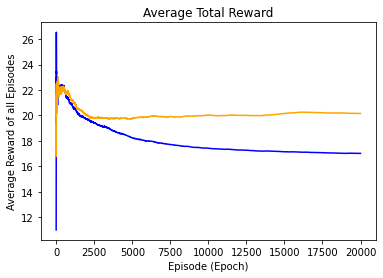

In [77]:
plt.plot([i for i in range(TOTAL_EPISODES)], rewards, color='blue')
plt.plot([i for i in range(TOTAL_EPISODES)], rewards1, color='orange')

plt.plot()
plt.title("Average Total Reward")
plt.xlabel("Episode (Epoch)")
plt.ylabel("Average Reward of all Episodes")
plt.show()

Let's bring down our original reset function

RESET FUNCTION 

In [ ]:
env = gnwrapper.Monitor(gym.make("CartPole-v1"))
buckets = (30,30,50,50)
actionspace = env.action_space.n

TOTAL_EPISODES = 20000
FRAMES = 200
epsilon = .9
gamma = .9
alpha = .5
decay = .001

QTable = np.random.randn(50,50,actionspace)
print(QTable)

Okay, so what should we change? We know it not be possible to use observations directly, as the observations are not discrete (see above). So, instead, let's try varying some ways to explore a bit. In this instance, we're going to be taking the minimum for each of our disc and set it to 20. Originally, we had it at 50, which we had found from an online article to be most efficient. Let's see what happens:

In [78]:
def make_discrete(observation):
  disc=np.array([0,0])
  temp = (observation[2] - (-env.observation_space.high[2])) // \
          ((env.observation_space.high[2] - (-env.observation_space.high[2]))/20)
  disc[0] = min(19, max(temp, 0))
  temp = (observation[3] - (-math.radians(50)))// \
          ((math.radians(50) - (-math.radians(50)))/20)
  disc[1] = min(19, max(temp, 0))
  return tuple(disc.astype(int))

SARSA

In [80]:
rewards = []
avgs = []

for epoch in range(TOTAL_EPISODES):
  observation = make_discrete(env.reset())
  action = next_action(observation)
  rewardTotal = 0
  for act in range(FRAMES):

    
    obstemp, reward, done, info = env.step(action)

    obstempdisc = make_discrete(obstemp)
    nextact = next_action(obstempdisc)

    
    QTable[observation + (action,)] = QTable[observation + (action,)] + \
              alpha*(reward + gamma*QTable[obstempdisc + (nextact,)]-QTable[observation + (action,)])
    action = nextact
    observation = obstempdisc
    rewardTotal += reward

    if done:
      
      break

  avgs.append(rewardTotal)
  epsilon = .01 + (.99)*np.exp(-decay*epoch)
  rewards.append(sum(avgs)/len(avgs))

rewards1 = rewards

Q Learning

In [82]:
rewards = []
avgs = []

for epoch in range(TOTAL_EPISODES):
  observation = make_discrete(env.reset())
  action = next_action(observation)
  rewardTotal = 0
  for act in range(FRAMES):

    
    obstemp, reward, done, info = env.step(action)

    obstempdisc = make_discrete(obstemp)
    nextact = next_action(obstempdisc)

    
    QTable[observation + (action,)] = QTable[observation[0], observation[1], action] +alpha * \
                  (reward+gamma*np.max(QTable[obstempdisc[0],obstempdisc[1]]) - QTable[observation[0], observation[1], action])
    action = nextact
    observation = obstempdisc
    rewardTotal += reward

    if done:
      
      break

  avgs.append(rewardTotal)
  epsilon = .01 + (.99)*np.exp(-decay*epoch)
  rewards.append(sum(avgs)/len(avgs))
  

Wow! Interesting results. Our algorithm learned to get the pole to stand up reliably after only ~2500 iterations! Let's try to think why: we're increasing the acceptable range of an action. By decreasing the denominator above, we are increasing the intensity of each state. This way, each state s 'weighed' more. Let's try the opposite and see what happens:

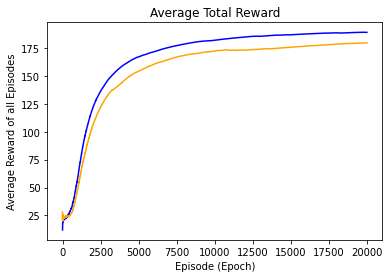

In [83]:
plt.plot([i for i in range(TOTAL_EPISODES)], rewards, color='blue')
plt.plot([i for i in range(TOTAL_EPISODES)], rewards1, color='orange')

plt.plot()
plt.title("Average Total Reward")
plt.xlabel("Episode (Epoch)")
plt.ylabel("Average Reward of all Episodes")
plt.show()

New Reset Function

In [ ]:
env = gnwrapper.Monitor(gym.make("CartPole-v1"))
buckets = (30,30,50,50)
actionspace = env.action_space.n

TOTAL_EPISODES = 20000
FRAMES = 200
epsilon = .9
gamma = .9
alpha = .5
decay = .001

QTable = np.random.randn(50,50,actionspace)
print(QTable)

Now, we're going to double the denominator, doing the opposite:

In [85]:
def make_discrete(observation):
  disc=np.array([0,0])
  temp = (observation[2] - (-env.observation_space.high[2])) // \
          ((env.observation_space.high[2] - (-env.observation_space.high[2]))/100)
  disc[0] = min(19, max(temp, 0))
  temp = (observation[3] - (-math.radians(50)))// \
          ((math.radians(50) - (-math.radians(50)))/100)
  disc[1] = min(19, max(temp, 0))
  return tuple(disc.astype(int))

SARSA

In [86]:
rewards = []
avgs = []

for epoch in range(TOTAL_EPISODES):
  observation = make_discrete(env.reset())
  action = next_action(observation)
  rewardTotal = 0
  for act in range(FRAMES):

    
    obstemp, reward, done, info = env.step(action)

    obstempdisc = make_discrete(obstemp)
    nextact = next_action(obstempdisc)

    
    QTable[observation + (action,)] = QTable[observation + (action,)] + \
              alpha*(reward + gamma*QTable[obstempdisc + (nextact,)]-QTable[observation + (action,)])
    action = nextact
    observation = obstempdisc
    rewardTotal += reward

    if done:
      
      break

  avgs.append(rewardTotal)
  epsilon = .01 + (.99)*np.exp(-decay*epoch)
  rewards.append(sum(avgs)/len(avgs))

rewards1 = rewards

Q Learning

In [88]:
rewards = []
avgs = []

for epoch in range(TOTAL_EPISODES):
  observation = make_discrete(env.reset())
  action = next_action(observation)
  rewardTotal = 0
  for act in range(FRAMES):

    
    obstemp, reward, done, info = env.step(action)

    obstempdisc = make_discrete(obstemp)
    nextact = next_action(obstempdisc)

    
    QTable[observation + (action,)] = QTable[observation[0], observation[1], action] +alpha * \
                  (reward+gamma*np.max(QTable[obstempdisc[0],obstempdisc[1]]) - QTable[observation[0], observation[1], action])
    action = nextact
    observation = obstempdisc
    rewardTotal += reward

    if done:
      
      break

  avgs.append(rewardTotal)
  epsilon = .01 + (.99)*np.exp(-decay*epoch)
  rewards.append(sum(avgs)/len(avgs))
  

Okay, let's try to break this down. We increased the denominator to 100 meaning we have decreased the weight of every step signficantly. So, the algorithm actually can't really ever learn what to do. Clearly, this is a poor way to represent state.

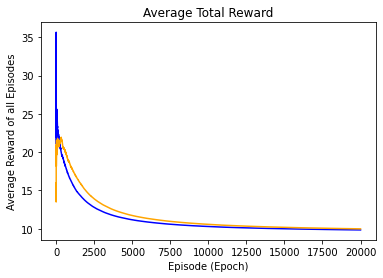

In [89]:
plt.plot([i for i in range(TOTAL_EPISODES)], rewards, color='blue')
plt.plot([i for i in range(TOTAL_EPISODES)], rewards1, color='orange')

plt.plot()
plt.title("Average Total Reward")
plt.xlabel("Episode (Epoch)")
plt.ylabel("Average Reward of all Episodes")
plt.show()

So what have we learned? Well, Temporal Difference was clearly the superior algorithm to epsilon greedy. We also learned that the extreme ends of alpha and gamma values aren't great, and to stick to using .9 and .5. So, we want to make sure we have a balanced alpha and gamma. We also learned that in creating state, it is best to choose a 'hash' equation that can create a unique number to represent state every time. We realized that increasing the denominator just made the number smaller and didn't do a great job representing state. We saw that a low number gave the numbers large differences, making the agent learn quicker for CartPole-v1, which was an interesting observation. Overall, I think we learned a lot about how Q Learning/SARSA work, how they differ, and how to create certain Algorithms based on different scenarios.